# Creating clusters on global development measurement dataset

In [1]:
# Importing Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import streamlit as st
from flask import Flask
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Reading the dataset
gdata=pd.read_excel(r"C:\Users\shrut\Downloads\World_development_mesurement.xlsx")
gdata

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,NaN,26998.0,"$54,790,058,957",0.035,$60,...,67.0,0.0,1.0,0.342,0.619,0.039,31719449.0,0.599,"$102,000,000","$193,000,000"
1,0.050,NaN,9542.0,Angola,NaN,NaN,7499.0,"$9,129,594,819",0.034,$22,...,44.0,0.0,1.0,0.476,0.499,0.025,13924930.0,0.324,"$34,000,000","$146,000,000"
2,0.043,NaN,1617.0,Benin,NaN,NaN,1983.0,"$2,359,122,303",0.043,$15,...,53.0,0.0,1.0,0.454,0.517,0.029,6949366.0,0.383,"$77,000,000","$50,000,000"
3,0.027,NaN,4276.0,Botswana,NaN,NaN,1836.0,"$5,788,311,645",0.047,$152,...,49.0,0.1,1.0,0.383,0.587,0.029,1755375.0,0.532,"$227,000,000","$209,000,000"
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,NaN,"$2,610,959,139",0.051,$12,...,49.0,0.0,1.0,0.468,0.505,0.028,11607944.0,0.178,"$23,000,000","$30,000,000"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,NaN,NaN,NaN,Turks and Caicos Islands,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1.0,NaN,NaN,NaN,32427.0,0.911,NaN,NaN
2700,0.013,46.4%,NaN,United States,5.0,4.0,2132446.0,"$16,244,600,000,000",0.179,"$8,895",...,76.0,1.0,1.0,0.196,0.667,0.136,313873685.0,0.811,"$200,092,000,000","$126,573,000,000"
2701,0.015,41.9%,NaN,Uruguay,7.0,85.0,NaN,"$50,004,354,667",0.089,"$1,308",...,74.0,1.5,1.0,0.220,0.639,0.140,3395253.0,0.948,"$2,222,000,000","$1,028,000,000"
2702,0.020,61.9%,NaN,"Venezuela, RB",144.0,180.0,NaN,"$381,286,223,859",0.046,$593,...,72.0,1.0,1.0,0.288,0.652,0.060,29954782.0,0.889,"$904,000,000","$3,202,000,000"


# EDA & DATA PROCESSSING

In [3]:
#Checking top 5 rows
gdata.head()

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,NaN,26998.0,"$54,790,058,957",0.035,$60,...,67.0,0.0,1.0,0.342,0.619,0.039,31719449.0,0.599,"$102,000,000","$193,000,000"
1,0.050,NaN,9542.0,Angola,NaN,NaN,7499.0,"$9,129,594,819",0.034,$22,...,44.0,0.0,1.0,0.476,0.499,0.025,13924930.0,0.324,"$34,000,000","$146,000,000"
2,0.043,NaN,1617.0,Benin,NaN,NaN,1983.0,"$2,359,122,303",0.043,$15,...,53.0,0.0,1.0,0.454,0.517,0.029,6949366.0,0.383,"$77,000,000","$50,000,000"
3,0.027,NaN,4276.0,Botswana,NaN,NaN,1836.0,"$5,788,311,645",0.047,$152,...,49.0,0.1,1.0,0.383,0.587,0.029,1755375.0,0.532,"$227,000,000","$209,000,000"
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,NaN,"$2,610,959,139",0.051,$12,...,49.0,0.0,1.0,0.468,0.505,0.028,11607944.0,0.178,"$23,000,000","$30,000,000"


In [4]:
#Checking bottom 5 rows
gdata.tail()

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
2699,NaN,NaN,NaN,Turks and Caicos Islands,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1.0,NaN,NaN,NaN,32427.0,0.911,NaN,NaN
2700,0.013,46.4%,NaN,United States,5.0,4.0,2132446.0,"$16,244,600,000,000",0.179,"$8,895",...,76.0,1.0,1.0,0.196,0.667,0.136,313873685.0,0.811,"$200,092,000,000","$126,573,000,000"
2701,0.015,41.9%,NaN,Uruguay,7.0,85.0,NaN,"$50,004,354,667",0.089,"$1,308",...,74.0,1.5,1.0,0.220,0.639,0.140,3395253.0,0.948,"$2,222,000,000","$1,028,000,000"
2702,0.020,61.9%,NaN,"Venezuela, RB",144.0,180.0,NaN,"$381,286,223,859",0.046,$593,...,72.0,1.0,1.0,0.288,0.652,0.060,29954782.0,0.889,"$904,000,000","$3,202,000,000"
2703,0.011,NaN,NaN,Virgin Islands (U.S.),NaN,NaN,NaN,NaN,NaN,NaN,...,76.0,NaN,1.0,0.206,0.641,0.152,105275.0,0.949,NaN,NaN


In [5]:
# Checking the summary of the data
gdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 25 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Birth Rate              2585 non-null   float64
 1   Business Tax Rate       1423 non-null   object 
 2   CO2 Emissions           2125 non-null   float64
 3   Country                 2704 non-null   object 
 4   Days to Start Business  1718 non-null   float64
 5   Ease of Business        185 non-null    float64
 6   Energy Usage            1785 non-null   float64
 7   GDP                     2494 non-null   object 
 8   Health Exp % GDP        2395 non-null   float64
 9   Health Exp/Capita       2395 non-null   object 
 10  Hours to do Tax         1416 non-null   float64
 11  Infant Mortality Rate   2444 non-null   float64
 12  Internet Usage          2531 non-null   float64
 13  Lending Interest        1880 non-null   float64
 14  Life Expectancy Female  2568 non-null   

In [6]:
#Checking shape of the data
gdata.shape

(2704, 25)

In [7]:
#Column names
gdata.columns

Index(['Birth Rate', 'Business Tax Rate', 'CO2 Emissions', 'Country',
       'Days to Start Business', 'Ease of Business', 'Energy Usage', 'GDP',
       'Health Exp % GDP', 'Health Exp/Capita', 'Hours to do Tax',
       'Infant Mortality Rate', 'Internet Usage', 'Lending Interest',
       'Life Expectancy Female', 'Life Expectancy Male', 'Mobile Phone Usage',
       'Number of Records', 'Population 0-14', 'Population 15-64',
       'Population 65+', 'Population Total', 'Population Urban',
       'Tourism Inbound', 'Tourism Outbound'],
      dtype='object')

In [8]:
#checking the Null values 
gdata.isnull().sum()

Birth Rate                 119
Business Tax Rate         1281
CO2 Emissions              579
Country                      0
Days to Start Business     986
Ease of Business          2519
Energy Usage               919
GDP                        210
Health Exp % GDP           309
Health Exp/Capita          309
Hours to do Tax           1288
Infant Mortality Rate      260
Internet Usage             173
Lending Interest           824
Life Expectancy Female     136
Life Expectancy Male       136
Mobile Phone Usage         167
Number of Records            0
Population 0-14            220
Population 15-64           220
Population 65+             220
Population Total             0
Population Urban            26
Tourism Inbound            368
Tourism Outbound           471
dtype: int64

In [9]:
#checking the Null values 
gdata.isnull().sum().sum()

11740

In [10]:
gdata.describe()

,Birth Rate,CO2 Emissions,Days to Start Business,Ease of Business,Energy Usage,Health Exp % GDP,Hours to do Tax,Infant Mortality Rate,Internet Usage,Lending Interest,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban
count,2585.000000,2.125000e+03,1718.000000,185.000000,1.785000e+03,2395.000000,1416.000000,2444.000000,2531.000000,1880.000000,2568.000000,2568.000000,2537.000000,2704.0,2484.000000,2484.000000,2484.000000,2.704000e+03,2678.000000
mean,0.022715,1.423071e+05,39.999418,94.875676,7.723684e+04,0.064170,302.068503,0.032813,0.239747,0.148103,71.159268,66.461838,0.578124,1.0,0.303051,0.623481,0.073465,3.145729e+07,0.562953
std,0.011338,6.159288e+05,57.318588,54.791906,2.599239e+05,0.026325,273.299686,0.029968,0.260132,0.171829,10.708262,9.390217,0.474647,0.0,0.106577,0.069660,0.049541,1.242894e+08,0.245897
min,0.007000,7.000000e+00,1.000000,1.000000,8.000000e+00,0.008000,12.000000,0.002000,0.000000,0.005000,39.000000,37.000000,0.000000,1.0,0.118000,0.474000,0.003000,1.887600e+04,0.082000
25%,0.013000,1.360000e+03,13.000000,48.000000,3.737000e+03,0.046000,156.000000,0.009000,0.000000,0.080000,64.000000,61.000000,0.100000,1.0,0.204750,0.559000,0.033000,8.783360e+05,0.356000
50%,0.020000,8.529000e+03,26.000000,94.000000,1.433800e+04,0.061000,239.000000,0.020000,0.100000,0.120000,75.000000,69.000000,0.500000,1.0,0.299500,0.642500,0.052000,5.800324e+06,0.560000
75%,0.031000,5.910800e+04,45.000000,142.000000,4.185200e+04,0.079000,344.750000,0.053000,0.400000,0.173000,79.000000,73.250000,0.900000,1.0,0.402000,0.676000,0.112000,2.014089e+07,0.765000
max,0.053000,8.286892e+06,694.000000,189.000000,2.727728e+06,0.225000,2600.000000,0.141000,1.000000,4.965000,87.000000,88.000000,2.900000,1.0,0.500000,0.858000,0.244000,1.350695e+09,1.000000


In [11]:
# Checking for duplicates
gdata[gdata.duplicated()].shape

(0, 25)

In [12]:
#Removing unwanted Characters.
gdata['GDP'] = gdata['GDP'].str.replace('$','')
gdata['Health Exp/Capita'] = gdata['Health Exp/Capita'].str.replace('$','')
gdata['Tourism Inbound'] = gdata['Tourism Inbound'].str.replace('$','')
gdata['Tourism Outbound'] = gdata['Tourism Outbound'].str.replace('$','')
gdata['Business Tax Rate'] = gdata['Business Tax Rate'].str.replace('%','')
gdata['GDP'] = gdata['GDP'].str.replace(',','')
gdata['Health Exp/Capita'] = gdata['Health Exp/Capita'].str.replace(',','')
gdata['Tourism Inbound'] = gdata['Tourism Inbound'].str.replace(',','')
gdata['Tourism Outbound'] = gdata['Tourism Outbound'].str.replace(',','')

In [13]:
gdata

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,NaN,26998.0,54790058957,0.035,60,...,67.0,0.0,1.0,0.342,0.619,0.039,31719449.0,0.599,102000000,193000000
1,0.050,NaN,9542.0,Angola,NaN,NaN,7499.0,9129594819,0.034,22,...,44.0,0.0,1.0,0.476,0.499,0.025,13924930.0,0.324,34000000,146000000
2,0.043,NaN,1617.0,Benin,NaN,NaN,1983.0,2359122303,0.043,15,...,53.0,0.0,1.0,0.454,0.517,0.029,6949366.0,0.383,77000000,50000000
3,0.027,NaN,4276.0,Botswana,NaN,NaN,1836.0,5788311645,0.047,152,...,49.0,0.1,1.0,0.383,0.587,0.029,1755375.0,0.532,227000000,209000000
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,NaN,2610959139,0.051,12,...,49.0,0.0,1.0,0.468,0.505,0.028,11607944.0,0.178,23000000,30000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,NaN,NaN,NaN,Turks and Caicos Islands,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1.0,NaN,NaN,NaN,32427.0,0.911,NaN,NaN
2700,0.013,46.4,NaN,United States,5.0,4.0,2132446.0,16244600000000,0.179,8895,...,76.0,1.0,1.0,0.196,0.667,0.136,313873685.0,0.811,200092000000,126573000000
2701,0.015,41.9,NaN,Uruguay,7.0,85.0,NaN,50004354667,0.089,1308,...,74.0,1.5,1.0,0.220,0.639,0.140,3395253.0,0.948,2222000000,1028000000
2702,0.020,61.9,NaN,"Venezuela, RB",144.0,180.0,NaN,381286223859,0.046,593,...,72.0,1.0,1.0,0.288,0.652,0.060,29954782.0,0.889,904000000,3202000000


In [14]:
#Checking for unique countries.
gdata.Country.nunique()

208

In [15]:
#Changing the dtypes.
gdata['GDP'] = gdata['GDP'].astype('float64')
gdata['Tourism Outbound'] = gdata['Tourism Outbound'].astype('float64')
gdata['Health Exp/Capita']= gdata['Health Exp/Capita'].astype('float64')
gdata['Tourism Inbound'] = gdata['Tourism Inbound'].astype('float64')
gdata['Business Tax Rate'] = gdata['Business Tax Rate'].astype('float64')

In [16]:
# Checking the datatypes
gdata.dtypes

Birth Rate                float64
Business Tax Rate         float64
CO2 Emissions             float64
Country                    object
Days to Start Business    float64
Ease of Business          float64
Energy Usage              float64
GDP                       float64
Health Exp % GDP          float64
Health Exp/Capita         float64
Hours to do Tax           float64
Infant Mortality Rate     float64
Internet Usage            float64
Lending Interest          float64
Life Expectancy Female    float64
Life Expectancy Male      float64
Mobile Phone Usage        float64
Number of Records         float64
Population 0-14           float64
Population 15-64          float64
Population 65+            float64
Population Total          float64
Population Urban          float64
Tourism Inbound           float64
Tourism Outbound          float64
dtype: object

In [17]:
#Creating a new dataframe
gdata_merged = gdata.groupby("Country").mean()
gdata_merged

,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
Country,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0.043154,36.3000,2375.727273,8.111111,170.0,NaN,9.718945e+09,0.091909,30.636364,275.0,...,56.384615,0.254545,1.0,0.490308,0.488769,0.020769,2.539926e+07,0.232923,1.060000e+08,8.240000e+07
Albania,0.014692,42.5500,3902.090909,23.000000,82.0,2024.583333,8.895522e+09,0.061462,168.846154,364.5,...,73.000000,0.561538,1.0,0.258385,0.653692,0.087923,2.956845e+06,0.478538,1.165231e+09,1.007077e+09
Algeria,0.022077,73.7125,102837.636364,25.000000,151.0,34042.166667,1.190391e+11,0.038462,133.846154,451.0,...,68.384615,0.492308,1.0,0.292692,0.663077,0.044231,3.476067e+07,0.645154,2.752308e+08,4.513077e+08
American Samoa,0.020500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.000000,1.0,NaN,NaN,NaN,5.752538e+04,0.880000,NaN,NaN
Andorra,0.010583,NaN,537.636364,NaN,NaN,NaN,2.268380e+09,0.063231,2394.461538,NaN,...,NaN,0.700000,1.0,NaN,NaN,NaN,7.668408e+04,0.897462,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Vietnam,0.016769,38.3375,98764.272727,43.200000,98.0,43263.750000,7.791354e+10,0.060769,51.692308,1000.5,...,70.076923,0.546154,1.0,0.266154,0.668538,0.065385,8.325515e+07,0.279462,3.597000e+09,1.325750e+09
Virgin Islands (U.S.),0.013000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,75.538462,0.483333,1.0,0.224769,0.661000,0.114308,1.073368e+05,0.938308,1.259091e+09,NaN
"Yemen, Rep.",0.034923,62.4750,19319.090909,41.300000,129.0,6517.833333,2.065261e+10,0.048308,49.000000,248.0,...,60.384615,0.215385,1.0,0.448077,0.524769,0.027231,2.066415e+07,0.295154,4.613077e+08,2.036667e+08


In [18]:
# Checking the count of missing values
gdata_merged.isnull().sum()

Birth Rate                 2
Business Tax Rate         23
CO2 Emissions             13
Days to Start Business    23
Ease of Business          23
Energy Usage              41
GDP                       11
Health Exp % GDP          23
Health Exp/Capita         23
Hours to do Tax           23
Infant Mortality Rate     20
Internet Usage             9
Lending Interest          45
Life Expectancy Female     5
Life Expectancy Male       5
Mobile Phone Usage         5
Number of Records          0
Population 0-14           16
Population 15-64          16
Population 65+            16
Population Total           0
Population Urban           2
Tourism Inbound           16
Tourism Outbound          22
dtype: int64

In [19]:
#imputing Missing values with mean.
gdata_merged.fillna(0, inplace=True)

In [20]:
# Checking count of missing values after imputing
gdata_merged.isnull().sum()

Birth Rate                0
Business Tax Rate         0
CO2 Emissions             0
Days to Start Business    0
Ease of Business          0
Energy Usage              0
GDP                       0
Health Exp % GDP          0
Health Exp/Capita         0
Hours to do Tax           0
Infant Mortality Rate     0
Internet Usage            0
Lending Interest          0
Life Expectancy Female    0
Life Expectancy Male      0
Mobile Phone Usage        0
Number of Records         0
Population 0-14           0
Population 15-64          0
Population 65+            0
Population Total          0
Population Urban          0
Tourism Inbound           0
Tourism Outbound          0
dtype: int64

In [21]:
# Checking for skewness
gdata_merged.skew().sort_values(ascending=True)

Life Expectancy Male     -2.662038
Life Expectancy Female   -2.514840
Population 15-64         -2.485491
Population 0-14          -0.409152
Population Urban         -0.029423
Number of Records         0.000000
Ease of Business          0.099059
Health Exp % GDP          0.257430
Mobile Phone Usage        0.314032
Birth Rate                0.644487
Population 65+            0.852182
Internet Usage            0.897190
Infant Mortality Rate     1.057373
Health Exp/Capita         2.695758
Business Tax Rate         3.789593
Hours to do Tax           4.049564
Tourism Outbound          5.571153
Lending Interest          7.090305
Tourism Inbound           7.277822
Energy Usage              8.230386
Days to Start Business    8.324472
CO2 Emissions             8.471650
Population Total          8.831102
GDP                       9.768576
dtype: float64

* Here we can see that the Life Expectancy Male, Life Expectancy Female,Population 15-64,Population 0-14,Population Urban have negative skewness.
* While Energy Usage,Days to Start Business,CO2 Emissions, Population Total,GDP has comparatively high positive skewness.

In [22]:
#Checking for Kurtosis
gdata_merged.kurtosis().sort_values(ascending=True)

Ease of Business           -1.267147
Population Urban           -0.999948
Mobile Phone Usage         -0.676911
Birth Rate                 -0.606447
Population 0-14            -0.458172
Population 65+             -0.350990
Internet Usage             -0.298262
Number of Records           0.000000
Infant Mortality Rate       0.153834
Health Exp % GDP            1.297291
Population 15-64            5.567919
Health Exp/Capita           7.135635
Life Expectancy Female      8.675560
Life Expectancy Male       10.029559
Business Tax Rate          20.168096
Hours to do Tax            29.201902
Tourism Outbound           36.788503
Tourism Inbound            69.748262
Energy Usage               75.268594
Lending Interest           75.771157
CO2 Emissions              77.407150
Population Total           83.856723
Days to Start Business     93.837649
GDP                       113.182972
dtype: float64

* Here we can see that the Ease of Business,Population Urban,Mobile Phone Usage,Birth Rate,Population 0-14,Population 65+,Internet Usage have negative kurtosis.
* While Energy Usage,Lending Interest,CO2 Emissions,Population Total,Days to Start Business,GDP have high positive kurtosis. 

In [23]:
#Checking for Correlation
gdata_merged.corr()

,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
Birth Rate,1.000000,0.344378,-0.155945,0.203982,0.714318,-0.159572,-0.176949,-0.009151,-0.432180,0.155593,...,-0.407070,-0.663650,NaN,0.862284,-0.116465,-0.602995,-0.045799,-0.587289,-0.265190,-0.269655
Business Tax Rate,0.344378,1.000000,0.055354,0.096678,0.443424,0.058133,0.040305,0.259441,-0.059306,0.263029,...,-0.097069,-0.187363,NaN,0.316464,0.111892,-0.006196,0.092423,-0.179559,0.025581,0.027102
CO2 Emissions,-0.155945,0.055354,1.000000,-0.033850,-0.083846,0.992701,0.836017,0.186622,0.264913,0.092458,...,0.113178,0.060809,NaN,-0.109948,0.128130,0.171494,0.731765,0.086326,0.725712,0.699272
Days to Start Business,0.203982,0.096678,-0.033850,1.000000,0.415999,-0.034434,-0.053688,0.033342,-0.141508,0.218098,...,-0.072355,-0.142602,NaN,0.252867,0.088053,-0.119771,0.019822,-0.118799,-0.093003,-0.086131
Ease of Business,0.714318,0.443424,-0.083846,0.415999,1.000000,-0.092693,-0.169406,0.108082,-0.409349,0.421280,...,-0.268733,-0.538327,NaN,0.707107,0.053534,-0.393966,0.062003,-0.496624,-0.253889,-0.257182
Energy Usage,-0.159572,0.058133,0.992701,-0.034434,-0.092693,1.000000,0.882183,0.212454,0.301514,0.108642,...,0.118792,0.069684,NaN,-0.112766,0.133442,0.191194,0.696697,0.100061,0.770684,0.741586
GDP,-0.176949,0.040305,0.836017,-0.053688,-0.169406,0.882183,1.000000,0.310072,0.458667,0.056087,...,0.156959,0.134496,NaN,-0.138278,0.118783,0.278725,0.387080,0.165583,0.889993,0.859177
Health Exp % GDP,-0.009151,0.259441,0.186622,0.033342,0.108082,0.212454,0.310072,1.000000,0.468098,0.165314,...,0.170150,0.117256,NaN,0.051839,0.259827,0.421168,0.010050,0.048296,0.338439,0.341084
Health Exp/Capita,-0.432180,-0.059306,0.264913,-0.141508,-0.409349,0.301514,0.458667,0.468098,1.000000,-0.164900,...,0.246163,0.485520,NaN,-0.388618,0.110048,0.544783,0.008570,0.445658,0.528836,0.561021
Hours to do Tax,0.155593,0.263029,0.092458,0.218098,0.421280,0.108642,0.056087,0.165314,-0.164900,1.000000,...,-0.008161,-0.083411,NaN,0.234892,0.199306,0.050563,0.171260,-0.063986,-0.022178,0.002218


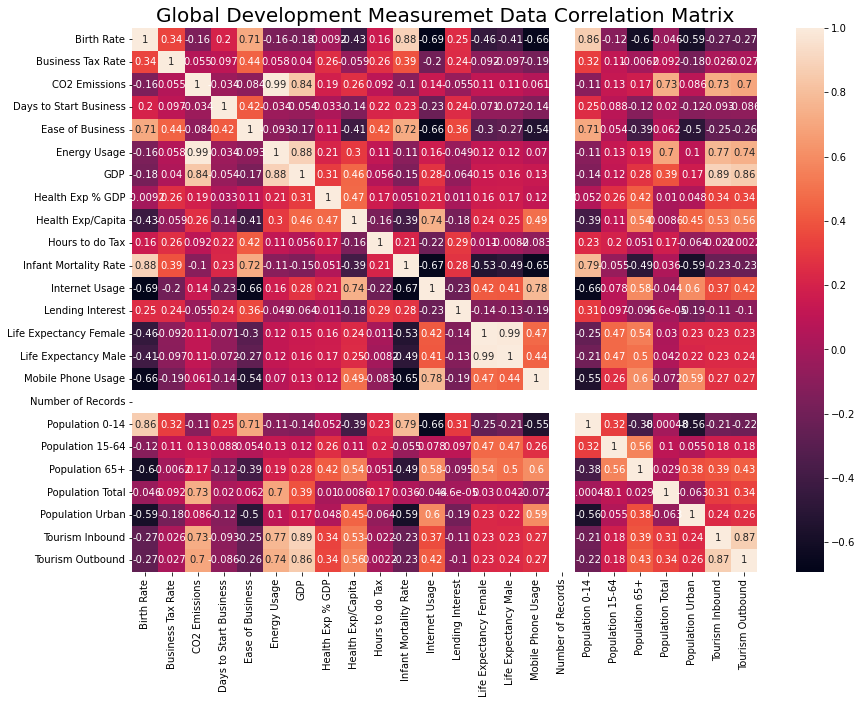

In [24]:
#plotting heatmap for Correlation
plt.figure(figsize=(14, 10))
sns.heatmap(gdata_merged.corr(), annot=True)
plt.title('Global Development Measuremet Data Correlation Matrix', fontsize=20)
plt.show()

* Birthrate has strong positive correlation with Population 0-14, infant Mortality Rate and strong Negative correlation with Life Expectancy Male, Life Expectancy FeMale
* Co2 Emission has strong correlation with Tourism Outbound, Tourism Inbound, Population Total, GDP and Energy Usage.
* Ease of Business has a Neagtive correlation with Internet Usage
* Energy Usage has Positive correlation with Tourism Outbound, Tourism Inbound, GDP and Co2 Emission.
* GDP has positive correlation with Tourism Outbound, Tourism Inbound, Energy Usage and Co2 Emission.
* Infant Mortality rate has a positive correlation with Population 0-14, Birthrate and Negative correlation with Life Expectancy Male, Life Expectancy FeMale.
* Internet usage has a positive correlation with Life Expectancy Male, Mobile Phone usage, Health exp/Capita and Negative correlation with Ease of Business
* Life Expectancy Female has a negative correlation with population 0-14,infrant mortality rate,Ease of business,Birth rate and strong positive correlation with Life Expectancy male,internet usage
* Life Expectancy male has strong correlation with Life Expectancy Female and negative correlation with birthrate,infrant moratality rate
* Mobile phone usage has a positive correlation with internet usage.
* Population 0-14 has a positive correlation with birth rate and negative correlation with Life Expectancy Female,Life Expectancy male
* Total population has a positive correlation with CO2 Emission,Energy Usage
* Tourism Inbound has a strong positive correlation with Tourism Outbound,GDP,Ease of business,CO2 Emissions
* Tourism Outbound has a strong positive correlation with GDP,Ease of business,CO2 Emissions

# Feature Engineering

In [25]:
gdata_merged.rename(columns={'Birth Rate':'Birth_Rate','Business Tax Rate':'Business_Tax_Rate','CO2 Emissions':'CO2_Emissions','Ease of Business':'Ease_of_Business','Energy Usage':'Energy_Usage','Days to Start Business':'Days_to_Start_Business','Health Exp % GDP':'Health_Exp%_GDP','Health Exp/Capita':'Health_Exp/Capita','Hours to do Tax':'Hours_to_do_Tax','Infant Mortality Rate':'Infant_Mortality_Rate','Internet Usage':'Internet_Usage','Lending Interest':'Lending_Interest','Life Expectancy Female':'Life_Expectancy_Female'},inplace=True)

In [26]:
gdata_merged.rename(columns={'Life Expectancy Male':'Life_Expectancy_Male','Mobile Phone Usage':'Mobile_Phone_Usage','Number of Records':'Number_of_Records','Population 0-14':'Population_0-14','Population 15-64':'Population_15-64','Population 65+':'Population_65+','Population Total':'Population_Total','Population Urban':'Population_Urban','Tourism Inbound':'Tourism_Inbound','Tourism Outbound':'Tourism_Outbound'}, inplace=True)

In [27]:
gdata_merged.head()

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Ease_of_Business,Energy_Usage,GDP,Health_Exp%_GDP,Health_Exp/Capita,Hours_to_do_Tax,...,Life_Expectancy_Male,Mobile_Phone_Usage,Number_of_Records,Population_0-14,Population_15-64,Population_65+,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound
Country,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0.043154,36.3000,2375.727273,8.111111,170.0,0.000000,9.718945e+09,0.091909,30.636364,275.0,...,56.384615,0.254545,1.0,0.490308,0.488769,0.020769,2.539926e+07,0.232923,1.060000e+08,8.240000e+07
Albania,0.014692,42.5500,3902.090909,23.000000,82.0,2024.583333,8.895522e+09,0.061462,168.846154,364.5,...,73.000000,0.561538,1.0,0.258385,0.653692,0.087923,2.956845e+06,0.478538,1.165231e+09,1.007077e+09
Algeria,0.022077,73.7125,102837.636364,25.000000,151.0,34042.166667,1.190391e+11,0.038462,133.846154,451.0,...,68.384615,0.492308,1.0,0.292692,0.663077,0.044231,3.476067e+07,0.645154,2.752308e+08,4.513077e+08
American Samoa,0.020500,0.0000,0.000000,0.000000,0.0,0.000000,0.000000e+00,0.000000,0.000000,0.0,...,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,5.752538e+04,0.880000,0.000000e+00,0.000000e+00
Andorra,0.010583,0.0000,537.636364,0.000000,0.0,0.000000,2.268380e+09,0.063231,2394.461538,0.0,...,0.000000,0.700000,1.0,0.000000,0.000000,0.000000,7.668408e+04,0.897462,0.000000e+00,0.000000e+00


#  DATA VISUALIZATION

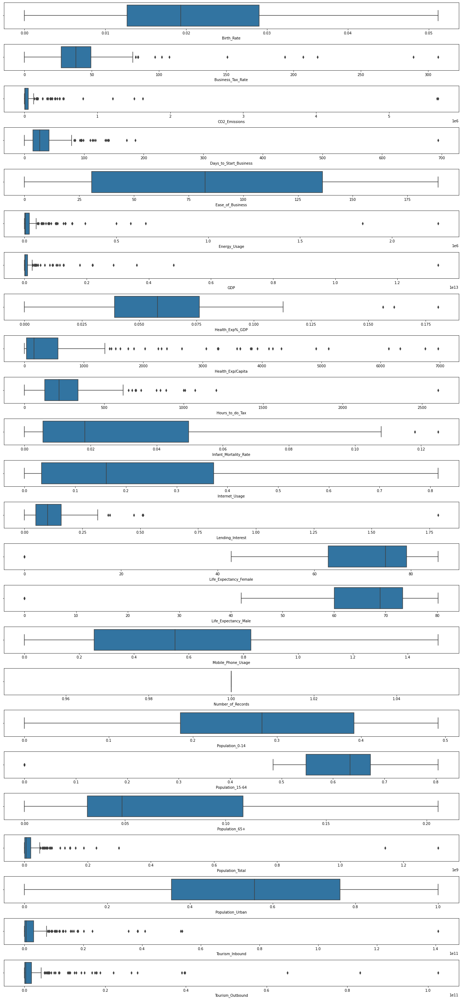

In [28]:
# Box Plot for outlier's detection
plt.figure(figsize=(18,40))
for i, j in enumerate(gdata_merged.columns):
    plt.subplot(25,1, i+1)
    sns.boxplot(x=gdata_merged[j])
    plt.xlabel(j)
    plt.tight_layout()

* From these plots we can see that the variables Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Energy_Usage,GDP, Health_Exp%_GDP,Health_Exp/Capita,Hours_to_do_tax,Infant_mortality_Rate,Lending_Interest,Life_Expectancy_Female, Life_Expectancy_Male,Population_15-64,Population_Total,Tourism_Inbound,Tourism_Outbound contains outliers.

Text(0.5, 1.01, 'Pairplot for all numerical variables')

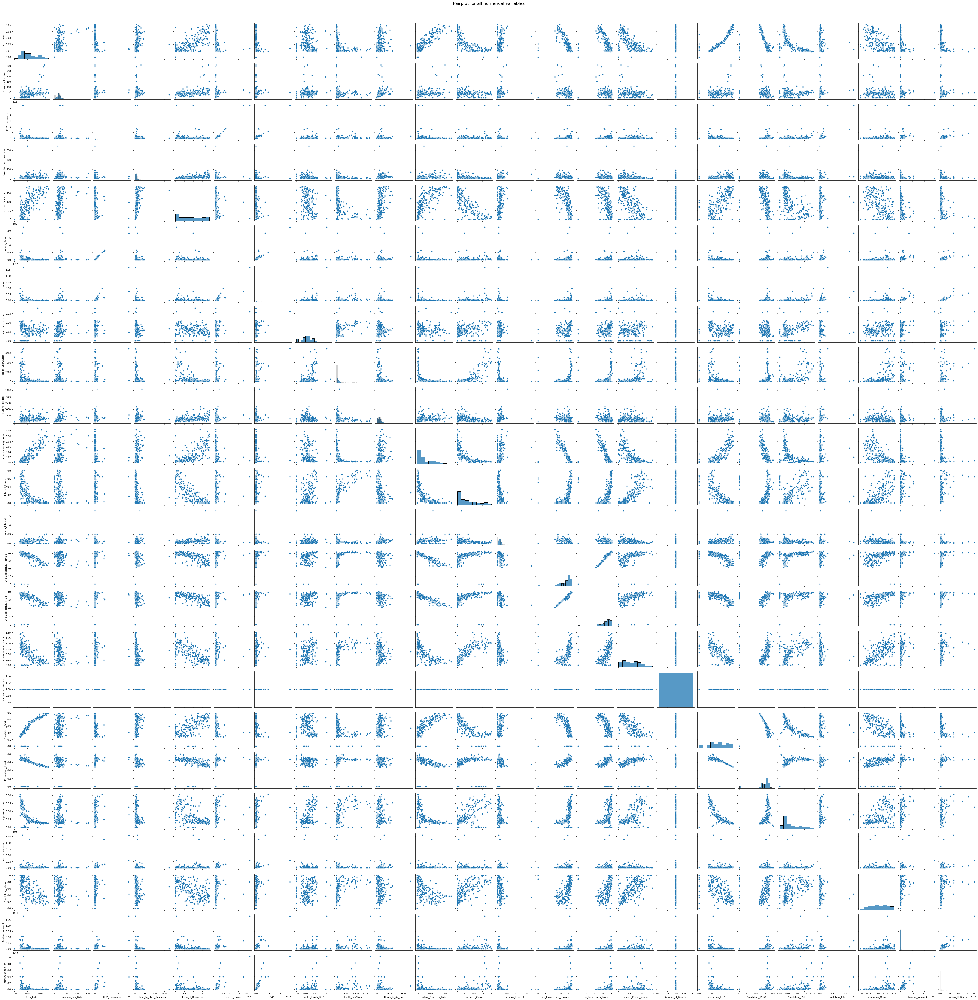

In [29]:
#Scatterplots
sns.pairplot(gdata_merged)
plt.suptitle("Pairplot for all numerical variables", y = 1.01, fontsize=18)

* Here we can observe relationship between variables for eg Birth Rate having a positive linear relationship with Population 0-14.
* We can see that the data has many underlying relationships between several variables.
* Also here the plot of Number of Records is constant throughout and hence it can be dropped.

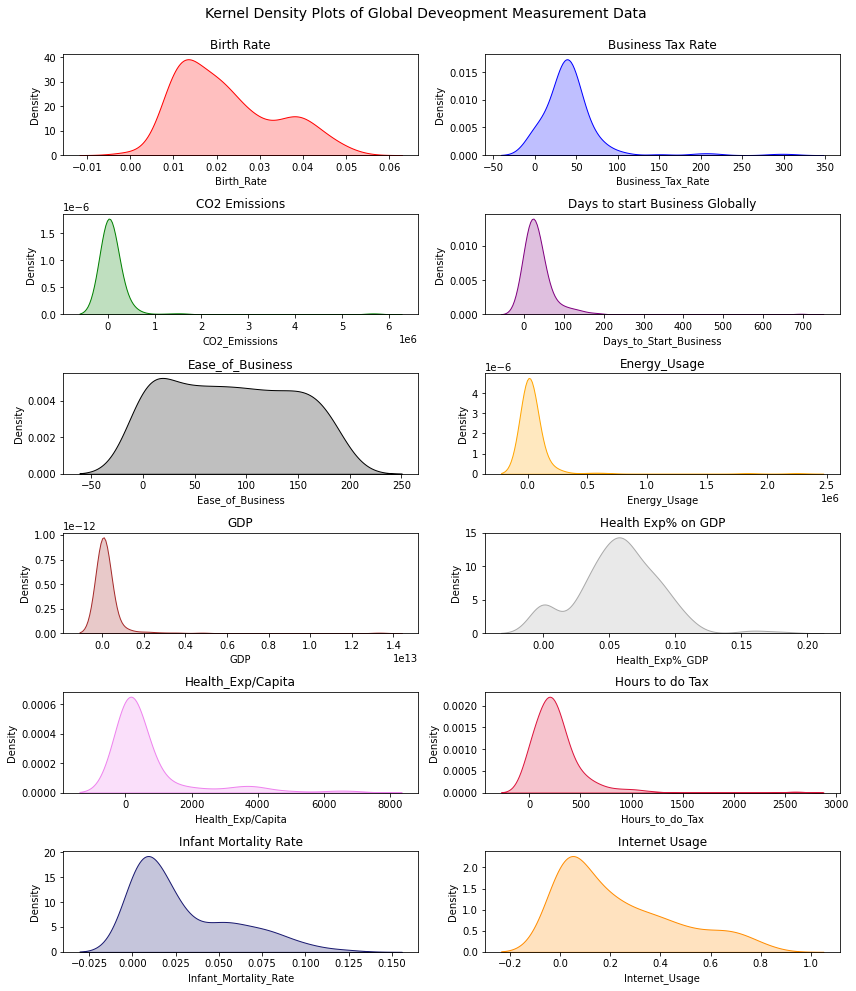

In [30]:
#Creating Subplots to visualize independent variables data

fig, axes = plt.subplots(nrows=6, ncols=2, figsize=(12,14))
#Plot KDE plots

sns.kdeplot(ax=axes[0,0], data=gdata_merged['Birth_Rate'], shade=True, color='red')
sns.kdeplot(ax=axes[0,1], data=gdata_merged['Business_Tax_Rate'], shade=True, color='blue')
sns.kdeplot(ax=axes[1,0], data=gdata_merged['CO2_Emissions'], shade=True, color='green')
sns.kdeplot(ax=axes[1,1], data=gdata_merged['Days_to_Start_Business'], shade=True, color='purple')
sns.kdeplot(ax=axes[2,0], data=gdata_merged['Ease_of_Business'], shade=True, color='black')
sns.kdeplot(ax=axes[2,1], data=gdata_merged['Energy_Usage'], shade=True, color='orange')
sns.kdeplot(ax=axes[3,0], data=gdata_merged['GDP'], shade=True, color='brown')
sns.kdeplot(ax=axes[3,1], data=gdata_merged['Health_Exp%_GDP'], shade=True, color='darkgrey')
sns.kdeplot(ax=axes[4,0], data=gdata_merged['Health_Exp/Capita'], shade=True, color='violet')
sns.kdeplot(ax=axes[4,1], data=gdata_merged['Hours_to_do_Tax'], shade=True, color='crimson')
sns.kdeplot(ax=axes[5,0], data=gdata_merged['Infant_Mortality_Rate'], shade=True, color='midnightblue')
sns.kdeplot(ax=axes[5,1], data=gdata_merged['Internet_Usage'], shade=True, color='darkorange')

#Set plot titles and labels
axes[0,0].set_title('Birth Rate')
axes[0,1].set_title('Business Tax Rate')
axes[1,0].set_title('CO2 Emissions')
axes[1,1].set_title('Days to start Business Globally')
axes[2,0].set_title('Ease_of_Business')
axes[2,1].set_title('Energy_Usage')
axes[3,0].set_title('GDP')
axes[3,1].set_title('Health Exp% on GDP')
axes[4,0].set_title('Health_Exp/Capita')
axes[4,1].set_title('Hours to do Tax')
axes[5,0].set_title('Infant Mortality Rate')
axes[5,1].set_title('Internet Usage')


fig.suptitle('Kernel Density Plots of Global Deveopment Measurement Data \n', fontsize=14,)
plt.tight_layout()
plt.show()

* Here we can see that the features have right skewed distribution.
* Also we can observe that Ease of doing business has platykurtic symmetrical distribution i.e it has negative kurtosis.

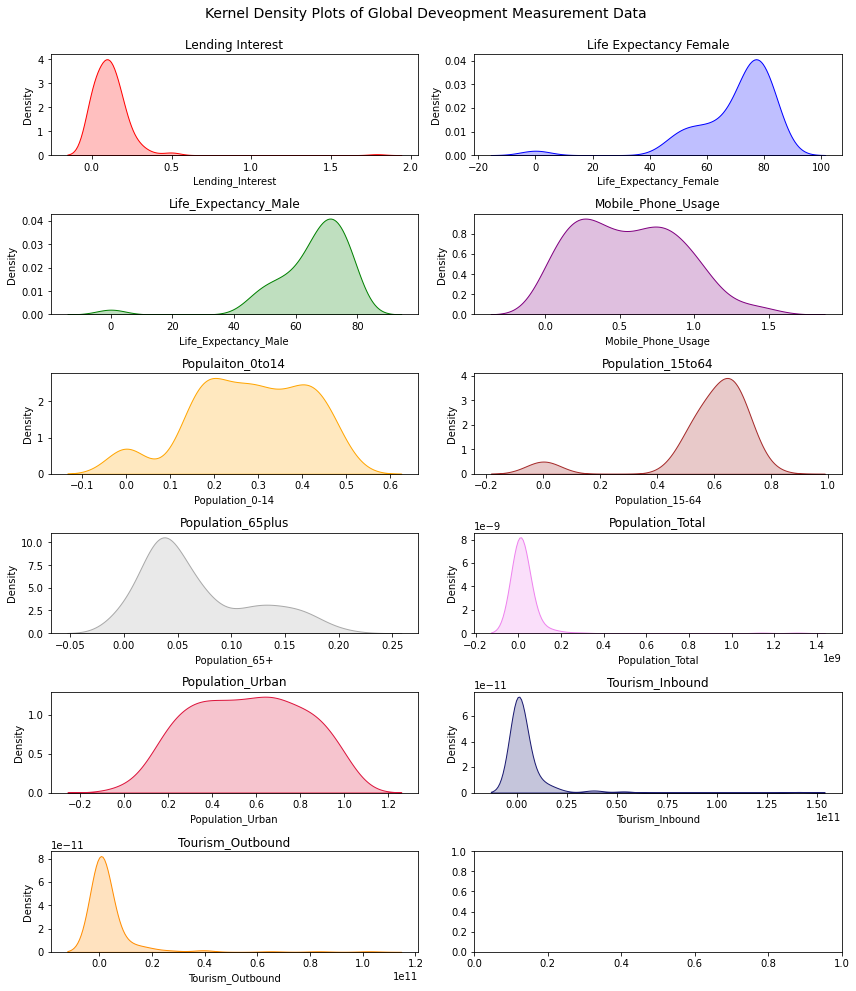

In [31]:
#Creating Subplots to visualize independent variables data

fig, axes = plt.subplots(nrows=6, ncols=2, figsize=(12,14))
#Plot KDE plots

sns.kdeplot(ax=axes[0,0], data=gdata_merged['Lending_Interest'], shade=True, color='red')
sns.kdeplot(ax=axes[0,1], data=gdata_merged['Life_Expectancy_Female'], shade=True, color='blue')
sns.kdeplot(ax=axes[1,0], data=gdata_merged['Life_Expectancy_Male'], shade=True, color='green')
sns.kdeplot(ax=axes[1,1], data=gdata_merged['Mobile_Phone_Usage'], shade=True, color='purple')
sns.kdeplot(ax=axes[2,0], data=gdata_merged['Population_0-14'], shade=True, color='orange')
sns.kdeplot(ax=axes[2,1], data=gdata_merged['Population_15-64'], shade=True, color='brown')
sns.kdeplot(ax=axes[3,0], data=gdata_merged['Population_65+'], shade=True, color='darkgrey')
sns.kdeplot(ax=axes[3,1], data=gdata_merged['Population_Total'], shade=True, color='violet')
sns.kdeplot(ax=axes[4,0], data=gdata_merged['Population_Urban'], shade=True, color='crimson')
sns.kdeplot(ax=axes[4,1], data=gdata_merged['Tourism_Inbound'], shade=True, color='midnightblue')
sns.kdeplot(ax=axes[5,0], data=gdata_merged['Tourism_Outbound'], shade=True, color='darkorange')

#Set plot titles and labels
axes[0,0].set_title('Lending Interest')
axes[0,1].set_title('Life Expectancy Female')
axes[1,0].set_title('Life_Expectancy_Male')
axes[1,1].set_title('Mobile_Phone_Usage')
axes[2,0].set_title('Populaiton_0to14')
axes[2,1].set_title('Population_15to64')
axes[3,0].set_title('Population_65plus')
axes[3,1].set_title('Population_Total')
axes[4,0].set_title('Population_Urban')
axes[4,1].set_title('Tourism_Inbound')
axes[5,0].set_title('Tourism_Outbound')


fig.suptitle('Kernel Density Plots of Global Deveopment Measurement Data \n', fontsize=14,)
plt.tight_layout()
plt.show()

* Here we can see that the Life Expectancy Female and Male & Population 15 ro 64 have left skewed distribution.
* Lendning Interest Rate, Mobile Phone Usage, Population 65 plus & Tourism Inbound and Outbound have right skewed distribution
* While Population Urban is platykurtic symmetrical distribution.

In [32]:
# Reset Index 
gdata1 = gdata_merged.copy()
gdata1.reset_index(inplace=True)
gdata1.columns

Index(['Country', 'Birth_Rate', 'Business_Tax_Rate', 'CO2_Emissions',
       'Days_to_Start_Business', 'Ease_of_Business', 'Energy_Usage', 'GDP',
       'Health_Exp%_GDP', 'Health_Exp/Capita', 'Hours_to_do_Tax',
       'Infant_Mortality_Rate', 'Internet_Usage', 'Lending_Interest',
       'Life_Expectancy_Female', 'Life_Expectancy_Male', 'Mobile_Phone_Usage',
       'Number_of_Records', 'Population_0-14', 'Population_15-64',
       'Population_65+', 'Population_Total', 'Population_Urban',
       'Tourism_Inbound', 'Tourism_Outbound'],
      dtype='object')

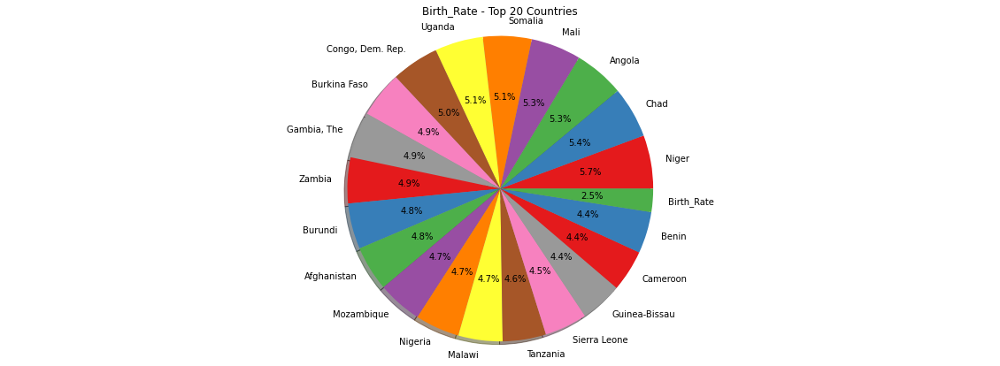

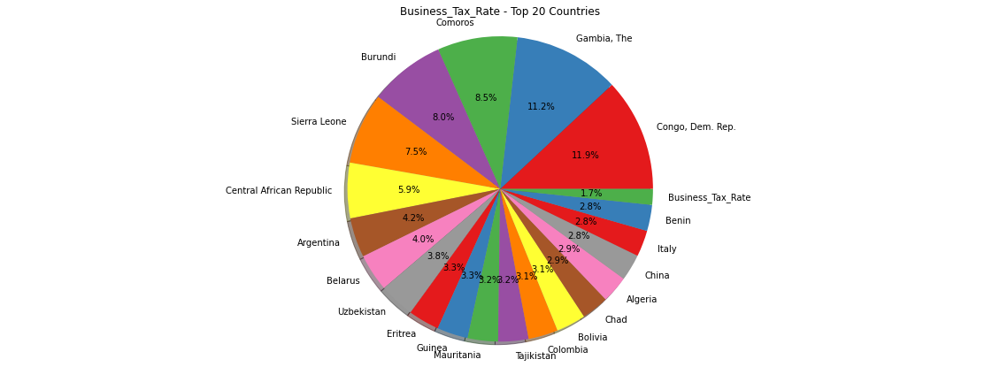

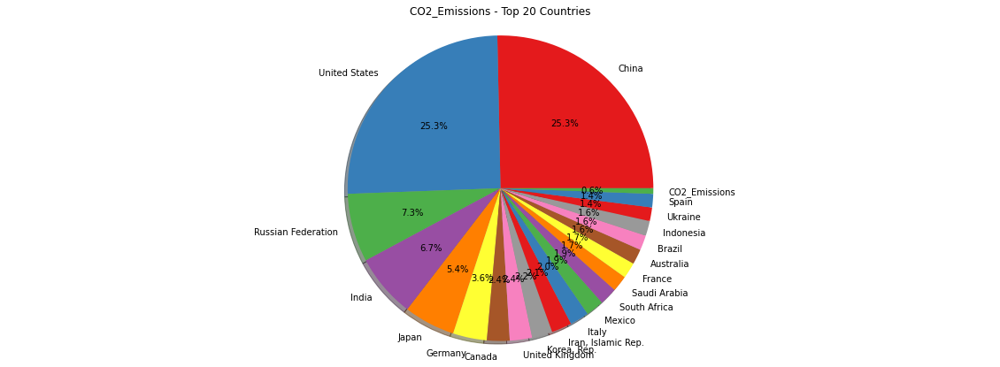

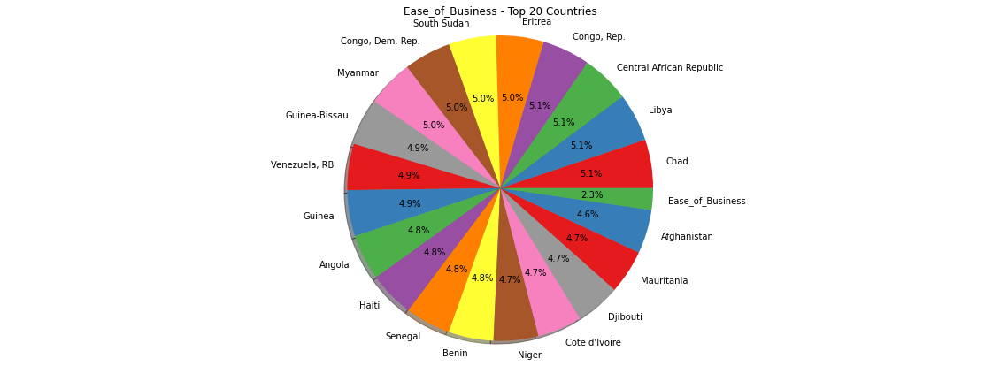

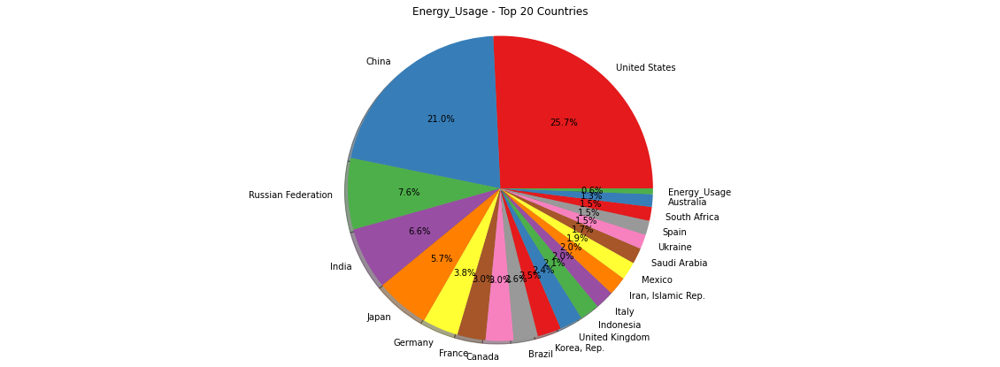

...

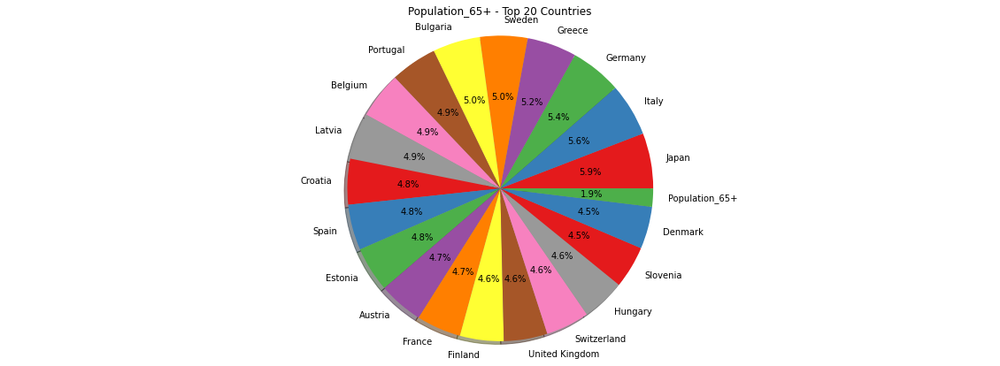

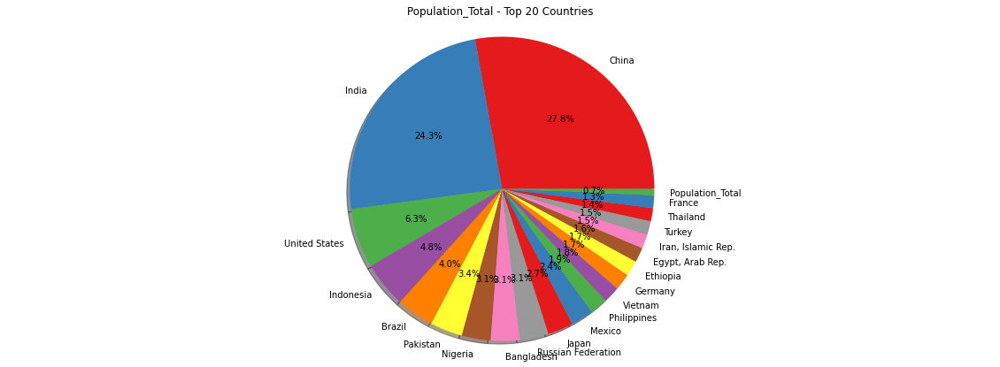

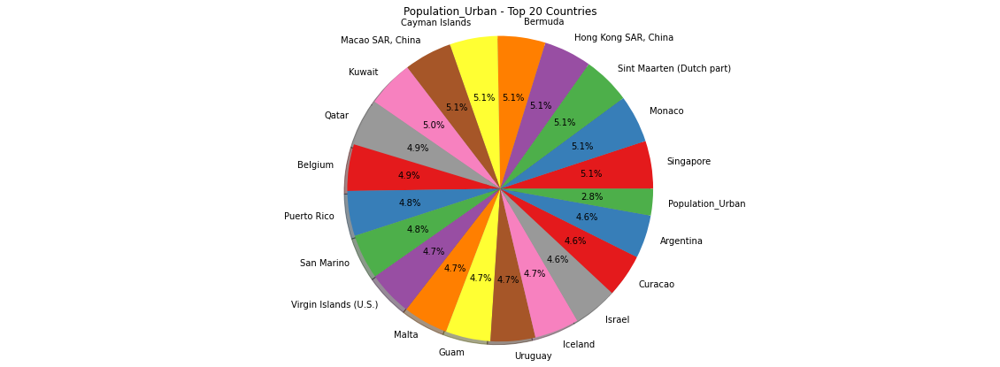

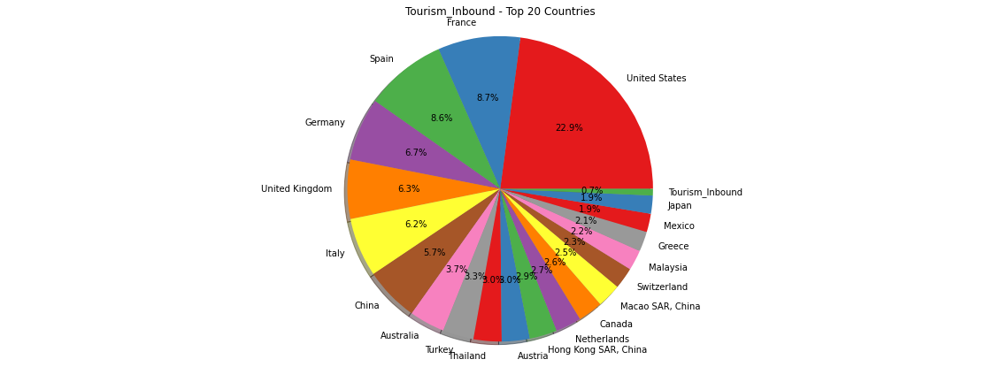

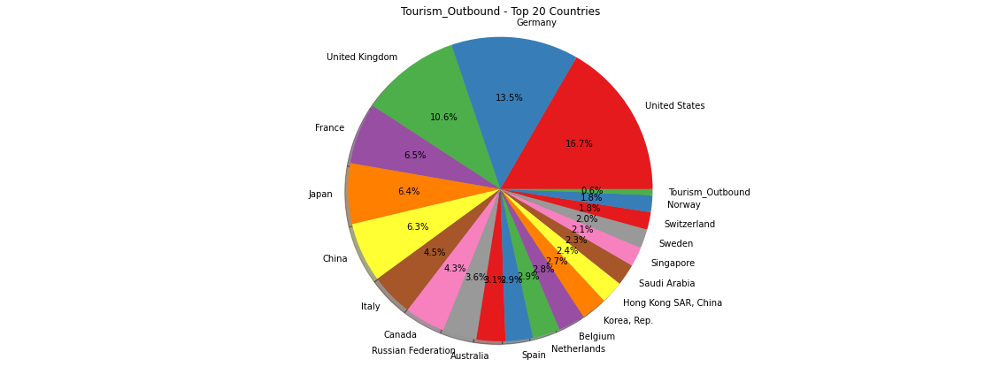

In [33]:
# Plotting pie plots
cols = ['Birth_Rate', 'Business_Tax_Rate', 'CO2_Emissions', 'Ease_of_Business', 'Energy_Usage', 'GDP',
       'Health_Exp%_GDP','Internet_Usage', 'Population_0-14', 'Population_15-64',
       'Population_65+', 'Population_Total', 'Population_Urban',
       'Tourism_Inbound', 'Tourism_Outbound']
for col in cols:
    top_values = gdata1.sort_values(col,ascending=False).head(20)
    mean = pd.DataFrame({'Country':[col], col:[gdata1[col].mean()]})
    combined = pd.concat([top_values[['Country',col]],mean],ignore_index=True)
    
    fig, ax = plt.subplots(figsize=(20,7))
    plt.title(col + ' - Top 20 Countries')
    colors = sns.color_palette("Set1", combined.shape[0]).as_hex()
    ax.pie(combined[col], labels=combined['Country'],colors=colors,autopct='%1.1f%%',shadow=True)
    ax.axis('equal')
    plt.show()

* We have plotted these pie plots to observe the variables with respect to every country in the dataset.
* We have plotted key variables against the countries from the data for the top 20 countries respectively.
* For eg in C02 Emissions US and China are major contributor of CO2 emissions with 25.3% each , the rest of 18 countries contribute to 48.8% emissions and 0.6% by the remaining countries.

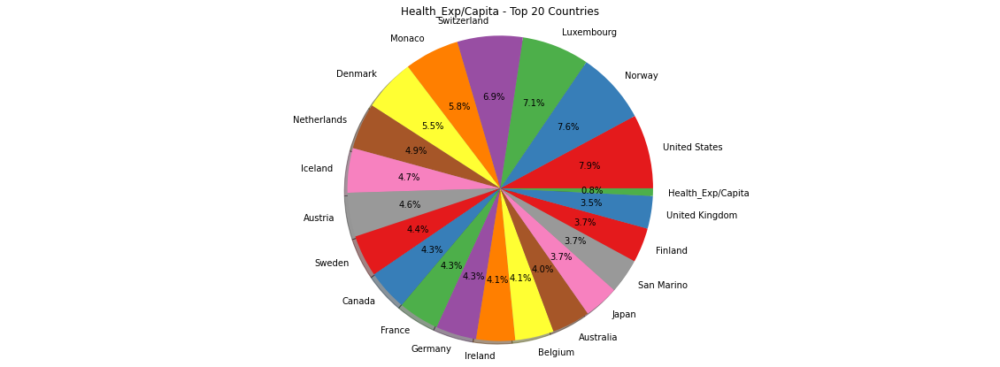

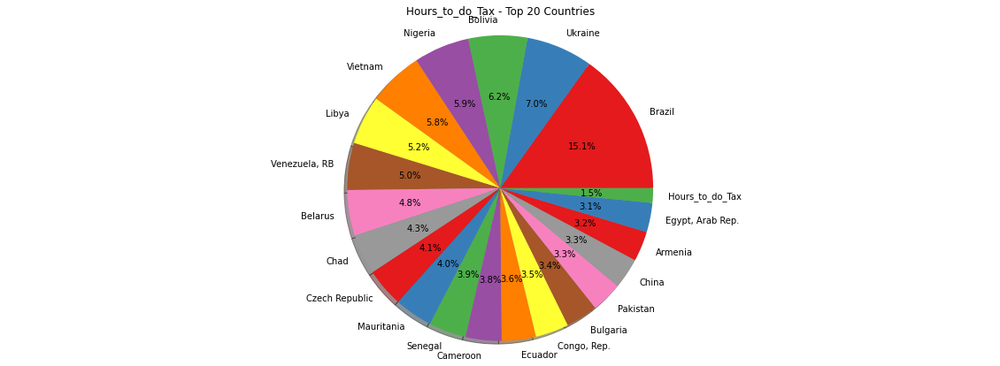

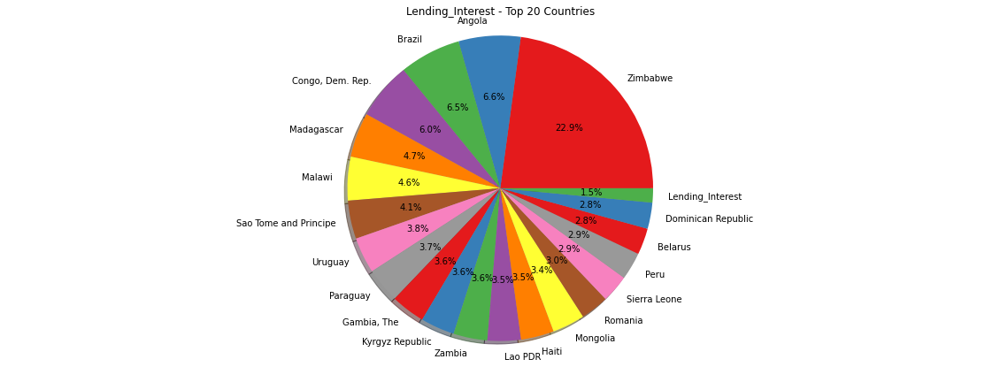

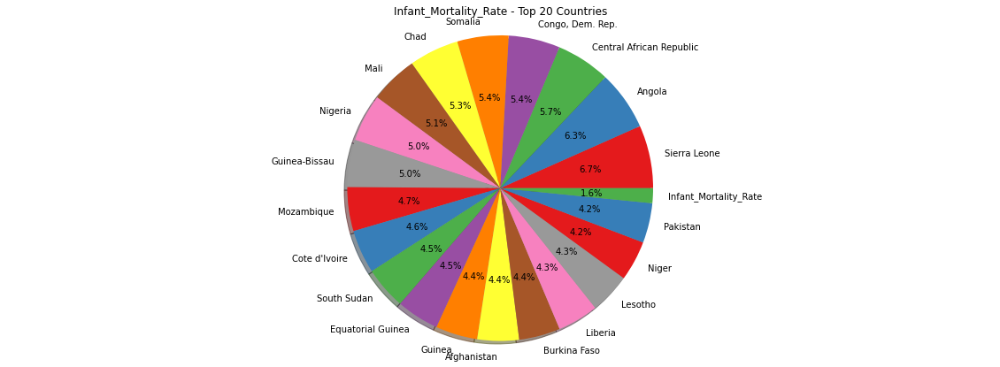

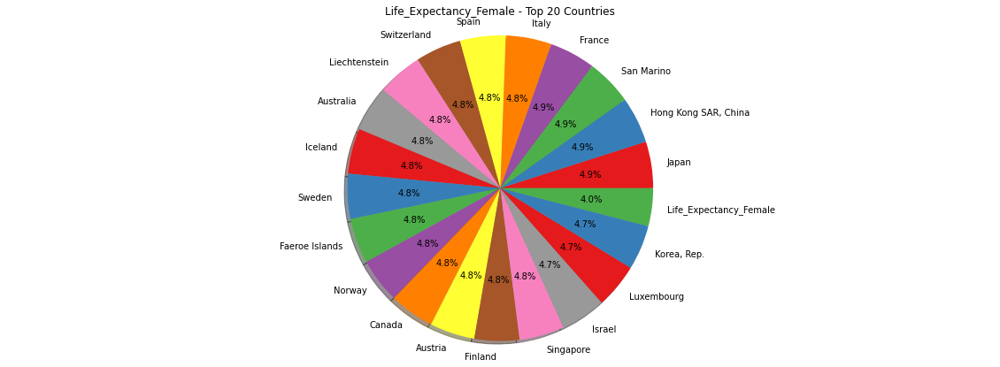

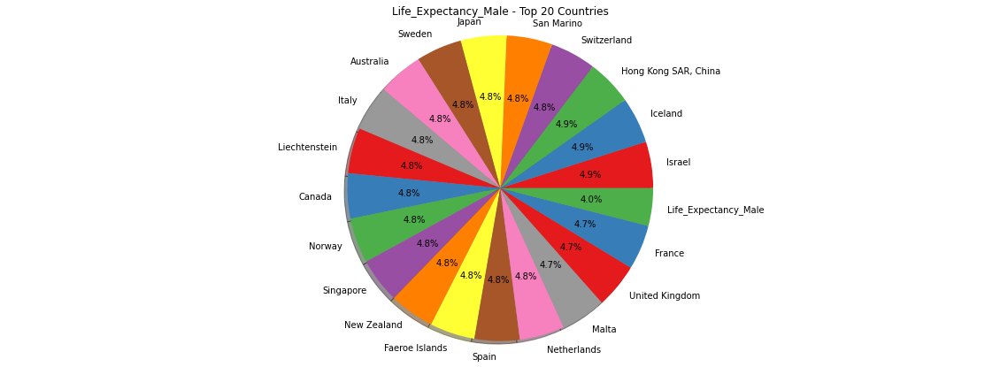

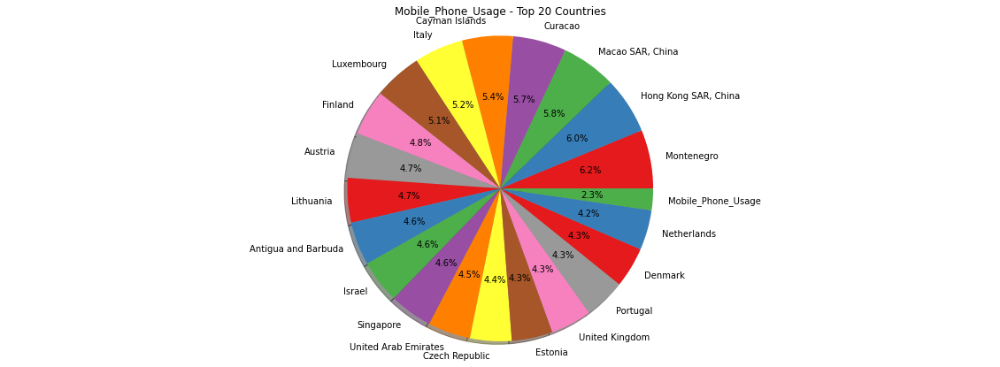

In [34]:
cols = ['Health_Exp/Capita', 'Hours_to_do_Tax','Lending_Interest','Infant_Mortality_Rate', 'Life_Expectancy_Female', 'Life_Expectancy_Male','Mobile_Phone_Usage']
for col in cols:
    top_values = gdata1.sort_values(col,ascending=False).head(20)
    mean = pd.DataFrame({'Country':[col], col:[gdata1[col].mean()]})
    combined = pd.concat([top_values[['Country',col]],mean],ignore_index=True)
    
    fig, ax = plt.subplots(figsize=(20,7))
    plt.title(col + ' - Top 20 Countries')
    colors = sns.color_palette("Set1", combined.shape[0]).as_hex()
    ax.pie(combined[col], labels=combined['Country'],colors=colors,autopct='%1.1f%%',shadow=True)
    ax.axis('equal')
    plt.show()

In [35]:
#Import plotly for visualization
import plotly.express as px

In [36]:
#Scatterplots for two variables
fig = px.scatter(gdata1,x = 'Birth_Rate' ,
              y = 'Infant_Mortality_Rate',color="Country",
              title = 'Birth Rate vs Infant Mortality Rate')
fig.show()

* Here we can observe countrywise data for Birth Rate against Infant Mortality Rate.
* The data points are overlapping and not spreaded randomly, it means that there is a strong positive linear relationship between Birth Rate and Infant Mortality Rate.

In [37]:
#Scatterplots for two variables
fig = px.scatter(gdata1,x = 'Population_Total' ,
              y = 'GDP',color="Country",
              title = 'Population Total vs GDP')
fig.show()

* The Data points are scattered randomly.
* There is no linear relationship between GDP and Total Population.

In [38]:
#Scatterplots for two variables
fig = px.scatter(gdata1,x = 'CO2_Emissions' ,
              y = 'Energy_Usage',color="Country",
              title = 'CO2 Emissions vs Energy Usage')
fig.show()

* Here we can observe the positive linear relationship between Energy usage and CO2 Emissions.
* From above linear relaitonship we can say that CO2 Emissions depends on Energy usage.

In [39]:
#Scatterplots for two variables
fig = px.scatter(gdata1,x = 'Tourism_Inbound' ,
              y = 'Tourism_Outbound',color="Country",
              title = 'Tourism_Inbound vs Tourism_Outbound')
fig.show()

* The data points are somewhat overlapping.
* This shows that there is a linear relationship between Tourism inbound & Tourism outbound.